# 3. FELADAT

## Tartsuk szem előtt!

Az ábrák legyenek áttekinthetőek, és szerepeljen rajtuk tengelyfelirat!
A kódrészletek legyenek letisztázottak, kommentek segítségével dokumentálandó minden megoldás.

# Főkomponens-analízis

A főkomponens-analízis, - más néven Karhunen-Loève-transzformáció - (angol nevén principal component analysis - PCA), egy lineáris eljárás, amely egy $D$ dimenziós vektorokból álló adathathalmazt egy ortogonális transzformáció - azaz $D$ dimenziós forgatás - segítségével olyan új bázisra visz át, ahol az adatvektorok közötti _kovariancia_ zérus. Az eredeti adatvektorok új bázis szerinti kifejtési együtthatóit főkomponens együtthatóknak nevezzük.

A főkomponens-analízis másképpen is megfogalmazható: Első lépésben keressük azt az irányvektort, melyre levetítve az adatvektorokat a projektált vektorok hosszának szórása maximálisnak adódik. Második lépésben levonjuk az adatvektorokból az így megtalált vektorra vett projekciót, majd az eljárást megismételjük oly módon, hogy megköveteljük, a következő irányvektor legyen merőleges az előzőleg megtaláltra. Az eljárást $D$-szer megismételve előáll a keresett bázis, amelyen az adatvektorokat kifejtve meghatározhatók a főkomponens együtthatók.

Jelöljük az adatvektorokat $\mathbf{x}_1, \mathbf{x}_2, ... \mathbf{x}_N$-nel, melyek mindegyike $D$ elemű. Legyen az $\mathbf{X}$ mátrix olyan, hogy sorvektoronként tartalmazza az $\mathbf{x}_i$ adatvektorokat, azaz $N$ sora és $D$ oszlopa van:

$$
X_{ij} =
\begin{bmatrix}
    x_{11}       & x_{12} & x_{13} & \dots & x_{1D} \\
    x_{21}       & x_{22} & x_{23} & \dots & x_{2D} \\
    ... \\
    x_{N1}       & x_{N2} & x_{N3} & \dots & x_{ND}
\end{bmatrix},
$$

ahol az első index az adatvektorokat, a második pedig a vektorkomponenseket indexeli.

### A kovarianciamátrix módszere

Az $X$ mátrix segítségével a főkomponens bázis megtalálására több ekvivalens módszert is találhatunk. Elsőként tekintsük az adatvektorok kovarianciamátrixát, melyet az $\mathbf{X}$ mátrix segítségével a következő alakban írhatunk:

$$
\mathbf{C} = \frac{1}{N}(\mathbf{X} - \mathbf{\mu})^\mathrm{T}(\mathbf{X} - \mathbf{\mu}),
$$

ahol $\mathbf{X} - \mathbf{\mu}$ úgy értelmezendő, hogy a mátrix minden sorából levonjuk az oszloponként vett átlagot. Könnyű látni, hogy a kovarianciamátrix mindig $D \times D$ méretű, tehát ha a a dimenziószám nagy, és kevés adatvektor van, azaz $D \gg N$, akkor a kovarianciamátrix előállítása nem célszerű.

### A duális főkomponens-analízis

Ha fennáll, hogy $D \gg N$, akkor érdemesebb a

$$
\tilde{\mathbf{C}} = \frac{1}{N}(\mathbf{X} - \mathbf{\mu})(\mathbf{X} - \mathbf{\mu})^\mathrm{T}
$$

mátrixot tekinteni, melyről belátható, hogy a $\tilde{\lambda}_i$ sajátértékei megegyeznek $\mathbf{C}$ nem zérus sajátértékeivel.
A $\tilde{\mathbf{C}}$ mátrix $\tilde{\mathbf{v}}_i$ sajátvektorai és a ${\mathbf{C}}$ mátrix $\mathbf{v}_i$ sajátvektorai között pedig fennáll, hogy

$$
\mathbf{v_i} = \frac{1}{\sqrt{N\tilde{\lambda}_i}} (\mathbf{X} - \mathbf{\mu})^\mathrm{T} \tilde{\mathbf{v}}_i.
$$

Ez utóbbi kifejezés úgy ellenőrizhető, ha felírjuk a duális problémában szereplő $(\mathbf{X} - \mathbf{\mu})(\mathbf{X} - \mathbf{\mu})^\mathrm{T}$ mátrix sajátérték-egyenletét, majd balról megszorozzuk $(\mathbf{X} - \mathbf{\mu})^\mathrm{T}$-vel.

### Főkomponens-analízis szingulárisérték-dekompozícióval

A szingulárisérték-dekompozíció (singular value decomposition - SVD) során egy tetszőleges $N \times M$ alakú mátrixot a következő módon faktorizálunk:

$$
\mathbf{A} = \mathbf{U} \mathbf{S} \mathbf{V}^\mathrm{T},
$$

ahol az $\mathbf{S}$ mátrix diagonális, és főátlójában az ún. szinguláris értékeket tartalmazza, $\mathbf{V}$ ortogonális mátrix oszlopaiban a jobboldali szinguláris vektorok, $\mathbf{U}$ ortogonális mátrix oszlopaiban pedig a baloldali szinguláris vektorok jelennek meg. A szinguláris értékek száma $K = \min(M, N)$, $\mathbf{U}$ és $\mathbf{V}$ pedig általában $N \times N$ és $M \times M$ alakú mátrixok. Belátható, hogy

* az $\mathbf{U}$ oszlopaiban lévő baloldali szinguláris vektorok azonosak az $\mathbf{A}\mathbf{A}^\mathrm{T}$ mátrix ortonormált sajátvektoraival
* a $\mathbf{V}$ oszlopaiban lévő jobboldali szinguláris vektorok azonosak az $\mathbf{A}^\mathrm{T}\mathbf{A}$ mátrix ortonormált sajátvektoraival
* a nem zérus szinguláris értékek azonosak $\mathbf{A}\mathbf{A}^\mathrm{T}$ és $\mathbf{A}^\mathrm{T}\mathbf{A}$ nem zérus sajátértékeinek négyzetgyökeivel.

Ezek figyelembe vételével a főkomponens-analízis közvetlenül SVD segítségével is elvégezhető, tekintve, hogy

$$
\mathbf{A}^\mathrm{T}\mathbf{A} = 
  (\mathbf{V} \mathbf{S}^\mathrm{T} \mathbf{U}^\mathrm{T})(\mathbf{U} \mathbf{S} \mathbf{V}^\mathrm{T}) = 
  \mathbf{V} \mathbf{S}^\mathrm{T} (\mathbf{U}^\mathrm{T} \mathbf{U}) \mathbf{S} \mathbf{V}^\mathrm{T} =
  \mathbf{V} \mathbf{S}^\mathrm{T} \mathbf{S} \mathbf{V}^\mathrm{T} =
  \mathbf{V} \mathbf{S}^2 \mathbf{V}^\mathrm{T}.
$$
Megjegyzendő, hogy komplex $\mathbf{A}$ esetén $\mathbf{U}$ és $\mathbf{V}$ unitér, és a transzponálások helyett adjungálást kell végezni.

A szingulárisérték-dekompozíció megvalósítására léteznek hatékony algoritmusok, így a kovarianciamátrix előállítása általában nem célszerű, de ha mégis szükséges, akkor többnyire a sajátérték-probléma megoldására is SVD-t használunk.

### A főkomponens együtthatók meghatározása

Fejtsük ki az eredeti adatvektorokat a kovarianciamátrix sajátvektorai által definiált bázison, azaz határozzuk meg az adatvektorok főkomponens együtthatóit! Ehhez elegendő belátni, hogy ezek előállnak a következő alakban:

$$
\mathbf{PC} = (\mathbf{X} - \mathbf{\mu}) \mathbf{V},
$$

ahol $\mathbf{V}$ a normált sajátvektorokból, mint oszlopvektorokból alkotott mátrix.

### Dimenzióredukció főkomponens-analízis segítségével

A kovarianciamátrix sajátértékei azt adják meg, hogy a nekik megfelelő sajátvektorokkal kijelölt irányokban mekkora az adatvektorok szórása. Belátható, hogy ha csak a néhány legnagyobb sajátértékhez tartozó sajátvektort, és az  ezeknek megfelelő főkomponens együtthatót tartjuk meg, akkor az adatvektoroknak egy olyan projekciójához jutunk, mely számot ad az adatokban rejlő variancia nagy részéről, viszont figyelmen kívül hagyja azokat az irányokat, amelyekben inkább csak _zaj_ látható. Emiatt a főkomponensanalízis hatékony lineáris adattömörítési, illetve zajszűrési eljárás is.

Ha a nagy dimenziószám nem indokolja, akkor a legnagyobb sajátértékek előállításához célszerű az SVD-n alapuló módszert alkalmazni, ugyanis az SVD-algoritmusok eleve nagyság szerint csökkenő sorrendben adják vissza a szinguláris értékeket. Ilyenkor a főkomponenseket nem a teljes sajátbázisra számítjuk ki, hanem csak az első $k$ legnagyobb szinguláris értékhez tartozó szinguláris vektort tartjuk meg a $\mathbf{V}$ mátrixból, és így végezzük el a korábbi kifejtést:

$$
\mathbf{PC}^{(k)} = (\mathbf{X} - \mathbf{\mu}) \mathbf{V}^{(k)},
$$

# Feladatok

## 1.a feladatrész: Főkomponens-analízis kis dimenziószám mellett

Talán nem köztudott, de Dobó István és seregének hősies várvédése után néhány évtizeddel a törökök mégis elfoglalták Eger várát, amelyet végül 335 évvel ezelőtt foglaltak vissza. Az egyik ostromnál egy fizikus-tanonc mérte az ágyúgolyók röptének időtartamát, a leérkezés távolságát és az árnyék mozgásából meghatározta a vízszintes sebességkomponens értékét is. Mivel egy lövéssorozatban sem sikerült pontosan egyformán lőni a golyókat, ezek egy-egy átlagos érték körül szóródó értékek.
Viszont fizikai tanulmányainkból tudjuk, hogy mindhárom mennyiség a kezdeti sebesség és emelkedési szög függvénye. Ha ez alapján modellezzük a mérési eredményeket, akkor azt kell lássuk, hogy a 3 mennyiség 3D terében egy 2D halmazt alkotnak, ami kis eltérések esetén síkkal közelíthető. Persze a mérési hibák miatt e sík kis környezetébe szóródnak a pontok, mint az alábbi 3 dimenziós ábrán láthatjuk. (Bár ezek különböző dimenziójú/mértékegységű mennyiségek, az összehasonlíthatóség kedvéért dimenziótlanítva, azaz természetes egységekbe átszámolva szerepelnek az adatok a beolvasott fájlban.)

E 3D ábra megjelenítéséhez lehetséges, hogy le kell futtatni e cellát (meg a notebook elején lévő csomagbetöltéseket).

In [1]:
# Ezek a csomagok kellenek/kellhetnek
from glob import glob
import cv2
import numpy as np
import scipy.linalg
import matplotlib.pyplot as plt
from plotly import offline as plotlyol
plotlyol.init_notebook_mode()
from plotly import graph_objs as plotlygo
%matplotlib inline
from sklearn.decomposition import PCA

In [2]:
t,l,vx=np.loadtxt("/v/courses/fiznum2.public/pca/demo-PCA.dat").T  # Így a fájl 3 oszlopa kerül a 3 változóba
trace = plotlygo.Scatter3d(x=t, y=l, z=vx, mode='markers',marker=dict(size=1),legendgroup="data") # Adatok csoportosítása trace-be
w=np.loadtxt("/v/courses/fiznum2.public/pca/demo-PCA-vect.dat")  # A demohoz rendelkezésre állnak itt a kovarianciamátrix sajátvektorai
mx=np.mean(t)                                    # de a saját munkához ki kell majd számolni
my=np.mean(l)
mz=np.mean(vx)
r=0.2              # a vektorok hossza
tracev0 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,0]], y=[my,my+r*w[1,0]], z=[mz,mz+r*w[2,0]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
tracev1 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,1]], y=[my,my+r*w[1,1]], z=[mz,mz+r*w[2,1]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
tracev2 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,2]], y=[my,my+r*w[1,2]], z=[mz,mz+r*w[2,2]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
layout3d = plotlygo.Layout(title='Ferde hajítás adatai egérrel zoomolható és forgatható ábrán')
fig_3D = plotlygo.Figure(data=[trace,tracev0,tracev1,tracev2],layout=layout3d)  # ábra objektum létrehozása
plotlyol.iplot(fig_3D)  # az ábra megjelenítése

A főkomponensanalízis segítségével megtalálhatjuk azt a lokális 2D koordinátarendszert, amihez a pontok jól illeszkednek. Ráadásul a két új koordináta korrelációja 0, tehát további vizsgálatokra a nagy adathalmaz modellezhető 2 függgetlen véletlen változóval. Ezeket megkapjuk, ha az adatok átlagtól való eltérésvektorait skalárszorzat végzésével vetítjük a sajátvektorokra. A vetítéssel kapott értékeket 2D-ben ábrázolva a ponthalmazt közelítő síkot forgatjuk be a 2D ábránkba:
![demo2d.png](demo2d.png)

A feladat nem a fenti, hanem egy új adatsor elemzése, amit a
"/v/courses/fiznum2.public/pca/work-PCA.dat"
fájlból kell betölteni.
Ebben soronként vannak egy mérésből kapott x,y,z értékek, sok mérés egymás után.
Készítsünk az adatokról a fentihez hasonló 3D scatter ábrát! 

Utána számítsuk ki az adatvektorok kovarianciamátrixát, majd oldjuk meg a kovarianciamátrix sajátérték-problémáját! Módosítsuk a 3D ábránkat úgy, hogy az adatpontokra rárajzoljuk a kovarianciamátrix sajátvektorait, a fenti bemutatóhoz hasonlóan. Ügyeljünk arra, hogy a sajátvektorokat a ponthalmaz súlypontjából kiindulva kell ábrázolni! Fogalmazzuk meg 1-2 mondatban, hogy mit várhatunk a sjátvektorok irányára, és hogy ez teljesül-e!

Írassuk ki az adathalmaz síkjához tartozó sajátértékek négyzetgyökeinek hányadosát! Fogalmazzuk meg, hogy ez az adathalmaz milyen tulajdonságával kapcsolatos!

Végül határozzuk meg, és ábrázoljuk az adatvektorok főkomponens együttható-vektorait azonos osztásközű skálák mellett! Mit figyelhetünk meg?

#### azt várom a sajátvektorok irányára, hogy ugyanolyan legyen mint a példaábrán. Komolyra fordítva azt, hogy 2 a síkjában legyen, egy pedig ezekre merőlegesen. egy bázist kifeszítve. Teljesült

In [3]:
t,l,vx=np.loadtxt("/v/courses/fiznum2.public/pca/work-PCA.dat").T  # Így a fájl 3 oszlopa kerül a 3 változóba
trace = plotlygo.Scatter3d(x=t, y=l, z=vx, mode='markers',marker=dict(size=1),legendgroup="data") # Adatok csoportosítása trace-be
xuj=[] # az átlagot kivet adataim
yuj=[]
zuj=[]
mx=np.mean(t)                                    
my=np.mean(l)
mz=np.mean(vx)
for adataim in range(len(t)): #hozzáadogatom az új értékeket
    xuj.append(t[adataim]-(sum(t)/len(t)))
    yuj.append(l[adataim]-(sum(l)/len(l)))
    zuj.append(vx[adataim]-(sum(vx)/len(vx)))
Xmatrixom=[xuj,yuj,zuj]
Xm=np.matrix(Xmatrixom) #ez a transzponált x-m
XM=Xm.T # ez is kelleni fog
N=len(xuj)
C=1/N*(Xm)*(XM) # cov mátrix a képlet alapján
r=1
sajtert,sajtv=np.linalg.eig(C)
sajtv0=np.linalg.norm(sajtv[0])
tracev0 = plotlygo.Scatter3d(x=[mx,mx+r*sajtv[0,0]], y=[my,my+r*sajtv[1,0]], z=[mz,mz+r*sajtv[2,0]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
tracev1 = plotlygo.Scatter3d(x=[mx,mx+r*sajtv[0,1]], y=[my,my+r*sajtv[1,1]], z=[mz,mz+r*sajtv[2,1]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
tracev2 = plotlygo.Scatter3d(x=[mx,mx+r*sajtv[0,2]], y=[my,my+r*sajtv[1,2]], z=[mz,mz+r*sajtv[2,2]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
layout3d = plotlygo.Layout(title='Ferde hajítás adatai egérrel zoomolható és forgatható ábrán')
fig_3D = plotlygo.Figure(data=[trace,tracev0,tracev1,tracev2],layout=layout3d)  # ábra objektum létrehozása
plotlyol.iplot(fig_3D)  # az ábra megjelenítése

In [4]:
print(np.sqrt(sajtert[0])-np.sqrt(sajtert[1])) # sajátértékek gyökének hányadosai
print(np.sqrt(sajtert[0])-np.sqrt(sajtert[2]))
print(np.sqrt(sajtert[1])-np.sqrt(sajtert[2]))


1.6478695304639421
2.5145423022466185
0.8666727717826761


https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

 "Now, if you like, you can decide to ignore the components of
lesser significance. You do lose some information, but if the eigenvalues are small, you
don’t lose much." Ha a sajátértékek kellően kicsit, akkor az adatmennyiség amit elveszítünk ezzel arányos mértékben szintén kicsi lesz. 


http://www.cs.otago.ac.nz/cosc453/student_tutorials/principal_components.pdf \
https://towardsdatascience.com/principal-component-analysis-from-scratch-in-numpy-61843da1f967


In [5]:
D = np.diag(sajtert)
P = sajtv
Z_new = np.dot(C, P)

In [6]:
type(np.array(sajtv[0]))

numpy.ndarray

In [7]:
pca = PCA(n_components=2)
pca.fit(Xm)

PCA(n_components=2)

In [8]:
Vseged=np.array([sajtv[0],sajtv[1],sajtv[2]])

In [9]:
V=np.matrix(Vseged)

In [10]:
V.shape

(3, 3)

In [11]:
PC=XM*V
print(PC)

[[ 1.51271052 -1.5817418  -0.04358929]
 [-0.59604017 -0.06232501 -0.15757244]
 [ 0.74301018 -1.0101341   0.26691678]
 ...
 [ 2.2970993   0.72327001  0.15390708]
 [ 4.5474588   0.3607513   0.11697047]
 [ 2.8466034   1.24625159 -0.0709607 ]]


In [12]:
PC1=np.array(PC[:,0]) # kiszedem a főkomponens együtthatóból a vektorokat
PC2=np.array(PC[:,1])
PC3=np.array(PC[:,2])

Text(0.5, 1.0, 'együttható vektorok ')

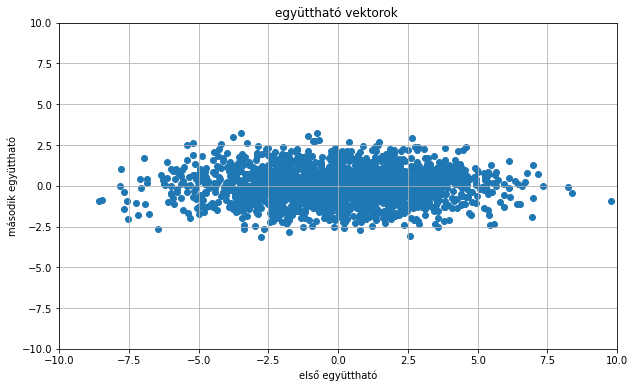

In [13]:
plt.figure(figsize=(10,6))
plt.ylim(-10,10)
plt.xlim(-10,10)
plt.scatter(PC1,PC2)
plt.xlabel("első együttható")
plt.ylabel("második együttható")
plt.xlim()
plt.grid()
plt.title("együttható vektorok " )

## 1.b feladatrész
Végezzük el az előző feladatrész számításait most a kovarianciamátrix meghatározása helyett közvetlenül szingulárisérték-dekompozícióval! Hogyan kaphatjuk vissza az SVD eredményéből a kovarianciamátrix sajátértékeit? Írassuk ki a jobboldali szinguláris vektorokat és szinguláris értékeket mindkét számítás alapján, hogy összehasonlítható legyen!
Ábrázoljuk az adatvektorok itt kapott főkomponens együtthatóit is 2D-ben!

https://numpy.org/doc/stable/reference/generated/numpy.linalg.svd.html \
https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

In [14]:
U, D, VT = np.linalg.svd(XM)
sajtertsvd=D**2/((np.shape(XM)[0])-1) # nunpy svd fgv-el megadok mindent, és a stats link alapján a sajátértékeket is
print("szingulásris értékek",D,"\n\n","jobb oldali szinguláris vektor\n",VT)
print("sajátvektor PCA szerint:\n",-sajtv.T,"\n és a szinguláris értékek:\n",pca.singular_values_)
print("sajátvértékeim PCA szerint:\n",sajtert,"\n és az SVD szerint:\n",sajtertsvd)

print("az alakjaim",U.shape, D.shape, VT.shape)
smat = np.zeros((2021, 3))
smat[:3, :3] = np.diag(D)

np.allclose(XM, np.dot(U, np.dot(smat, VT))) # visszanyerjükk az eredtit? igeeeen. legalábbis azt mondta, hogy true
#D_diag= np.array([[D[0], 0, 0], [0, D[1], 0],[0,0,D[2]]])
#U*D_diag*VT


szingulásris értékek [119.70494509  45.62409107   6.66235417] 

 jobb oldali szinguláris vektor
 [[-0.94525488 -0.22806117 -0.23341234]
 [-0.29357594  0.90662372  0.30306203]
 [ 0.14250049  0.35499511 -0.92394377]]
sajátvektor PCA szerint:
 [[-0.94525488 -0.22806117 -0.23341234]
 [-0.29357594  0.90662372  0.30306203]
 [ 0.14250049  0.35499511 -0.92394377]] 
 és a szinguláris értékek:
 [77.98479567 18.34624655]
sajátvértékeim PCA szerint:
 [7.09018994 1.02996422 0.02196287] 
 és az SVD szerint:
 [7.09369994 1.0304741  0.02197374]
az alakjaim (2021, 2021) (3,) (3, 3)


True

In [15]:
SVD=XM*VT

In [16]:
SVD1=np.array(SVD[:,0])
SVD2=np.array(SVD[:,1])
SVD3=np.array(SVD[:,2])

Text(0.5, 1.0, 'együttható vektorok ')

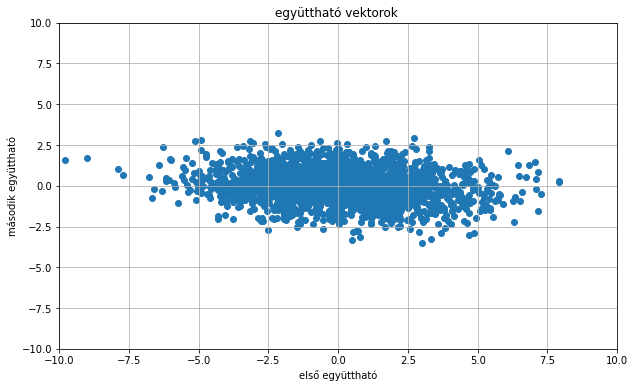

In [17]:
plt.figure(figsize=(10,6))
plt.ylim(-10,10)
plt.xlim(-10,10)
plt.scatter(SVD1,SVD2)
plt.xlabel("első együttható")
plt.ylabel("második együttható") # ugyanazt mint az 1/a-ban
plt.grid()
plt.title("együttható vektorok " )

## 2. feladatrész - Sajátarcok meghatározása

Az 1. feladatrészben sikerült az adatok dimenzióját csökkenteni. Ez nyilván főleg nagyobb dimenziószám esetén hasznos, gondolhatunk 1-10-100 dimenziós adatvektorokra.
Az alábbi példában még ennél is nagyobb dimenzóval lesz dolgunk. Fekete-fehér fényképek esetén egy adatvektor annyi dimenziós, amennyi pixelből áll a kép (színes kép esetén ez szorzandó a színkomponensek számával).

A következő cellában szereplő függvény az argumentumként megadott mappából megfelelő formátumú fájlokat tölt be. 
Az azt követő  cellában látottak szerint lehet e függvénnyel az előkészített 
$N=94$ kutyafényképet betölteni  egy `numpy` adattömbbe. Az adattömb indexei a következők:

* 1: A fénykép sorszáma 0-tól
* 2: A fényképek sorainak száma (290)
* 3: A fényképek oszlopainak száma (220)

A szürkeárnyalatos fényképek úgy ábrázolódnak a számítógépben, hogy minden pixelhez egy 0 és 255 közötti egész szám tartozik (uint8 adattípus). A 0 érték fekete pixelt, a 255 fehéret, a köztes értékek pedig egy lineáris skálán a szürke különböző árnyalatait jelentik. A képek megjelenítésére a `matplotlib.pyplot.imshow` parancsa használható, az alábbi példák szerint.

A feladat az lesz, hogy alakítsük át a képeket adatvektorrá (például a `reshape`, `flatten` vagy `ravel` függvény segítségével), majd végezzük el az adatvektorok főkomponens bázis analízisét. Ez azt jelenti, hogy határozzuk meg azt a bázist, melyen a képekből készített adatvektorok korrelálatlanok. Mivel jelen esetben a $D = 290 \cdot 220 = 63800$ dimenziószám jóval nagyobb, mint $N$, a képek száma, ezért a bevezetőben említett lehetőségek közül csak a duális-PCA jöhet szóba. 

* ábrázoljuk a sajátértékeket csökkenő sorrendben, a sorszámuk függvényében

* alakítsuk vissza a sajátvektorokat képpé, és ábrázoljuk az első $42$ sajátértékhez tartozó sajátvektorokat



In [18]:
# Ezeket még segítségül megadjuk
def load_pics(s):
    files = glob(s)
    img = cv2.imread(files[0])
    imgs = np.empty((len(files), img.shape[0], img.shape[1]), dtype=np.uint8)
    for i in range(0, len(files)):
        imgs[i,:,:] = cv2.imread(files[i])[:,:,0]
    return imgs

In [19]:
imgs = load_pics('/v/courses/fiznum2.public/pca/101puppies/database/*.jpg')
n, h, w = imgs.shape
print (f'{n} dogs ({w}x{h})')

94 dogs (220x290)


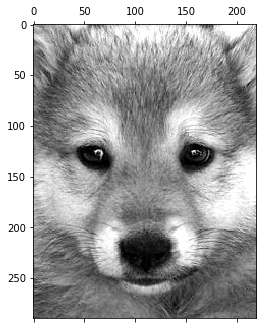

In [20]:
plt.matshow(imgs[0], cmap = 'gray')
plt.show()

In [21]:
xek=[]
for i in range(94): # lapítom a képeket
    x=imgs[i].flatten()
    xek.append(x)


In [22]:
X2m=[]
for atlag in range(63800):
    X2m.append(np.matrix(xek)[:,atlag]-np.mean(np.matrix(xek)[:,atlag])) #átlag kivonás
X2=np.matrix(np.array(X2m)).T

In [23]:
Xm2=np.matrix(X2)
XM2=Xm2.T
N=94
C2=(1/N)*(Xm2)*(XM2)
sajtert2,sajtv2=np.linalg.eig(C2) # van egy nagyon pici de negatív értékem, azt beadom neki, hogy mennyi legyen, ami kb. ugyanakkora nagyságrendü
sajtert2=np.asarray([1.6*10**6 if num<0 else num for num in sajtert2]) 





In [24]:
kutyusok=((1/np.sqrt(94*sajtert2))*np.dot(np.array(XM2),np.array(sajtv2)).reshape(290,220,94)) # az átalakított sajátvektorok

In [25]:
csokken=(np.sort(np.array(sajtert2))[::-1]) # csökkenő sorrend

In [26]:
sajtv4=kutyusok[np.argsort(sajtert2)[::-1],:]

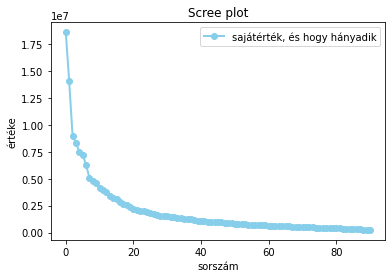

In [27]:
plt.plot( csokken[3:94], marker='o', markersize=6, color='skyblue', linewidth=2, label='sajátérték, és hogy hányadik')
plt.legend()
plt.title('Scree plot')
plt.xlabel('sorszám') # plotolás csökkenő sorrendben
plt.ylabel('értéke')
plt.show()

az első pár elem annyira nagy, hogy egy majdnem  L betüt kapok, hogyha azt is beleteszem.

In [28]:
uj=kutyusok.reshape(63800,94)
PCK=np.dot(Xm2,uj) # visszaalakítás
kutyulik=np.dot(np.array(PCK),uj.T).reshape(94,290,220)

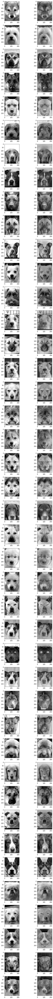

In [29]:
fig, ax = plt.subplots(nrows=42, ncols=2, figsize=(8,100)) 
for i in range(42): # imshow-al megmutaom aképeket
    ax[i, 0].imshow(imgs[i],cmap='gray')
    ax[i, 1].imshow(kutyulik[i],cmap='gray')

plt.tight_layout()
plt.show()

In [30]:
print(kutyulik[0:42])

[[[  79.11702128   50.55319149   10.07446809 ...  139.36170213
    157.37234043  130.87234043]
  [  57.87234043   60.38297872   63.37234043 ...  155.87234043
    128.15957447   61.9787234 ]
  [  74.32978723   61.27659574   46.03191489 ...  151.90425532
     94.68085106   81.4893617 ]
  ...
  [  22.43617021  -12.13829787  -21.87234043 ...  -10.07446809
    -18.79787234  -26.30851064]
  [ -19.85106383  -39.92553191  -47.79787234 ...   -3.56382979
    -15.24468085  -24.21276596]
  [ -48.55319149  -36.5212766   -33.13829787 ...    1.67021277
     -9.0212766   -16.10638298]]

 [[ -59.88297872  -58.44680851  -55.92553191 ...  -43.63829787
    -41.62765957  -45.12765957]
  [ -57.12765957  -54.61702128  -51.62765957 ...  -44.12765957
    -42.84042553  -44.0212766 ]
  [ -50.67021277  -46.72340426  -42.96808511 ...  -48.09574468
    -44.31914894  -45.5106383 ]
  ...
  [  20.43617021   12.86170213   15.12765957 ...  107.92553191
    110.20212766   90.69148936]
  [  17.14893617   16.07446809   18.

# 3. feladatrész

### a) 
A második feladatrészben meghatározott $N=42$ legnagyobb sajátértékekhez tartozó sajátvektorok segítségével a $94$ elemű bázis helyett egy csonkolt bázist definiálhatunk, olymódon, hogy csak ezeket a  sajátvektorokat tartjuk meg.  Határozzuk meg az eredeti, $94$ képhez tartozó főkomponens együtthatókat a csonkolt bázison! 

### b)
A fentebb kiszámolt főkomponens együtthatók és a csonkolt bázis segítségével keszítsük el az első $17$ kutya-arc csonkolt bázison történő rekonstrukcióját! Alakítsuk vissza kép formába az eredményt és mutassuk be egymás mellett az eredeti és rekonstruált képeket!

### c)
Próbáljuk tovább csökkenteni a kifejtéshez használt bázisvektorok számát és figyeljük meg, hogy hány bázisvektor megtartása esetén maradnak a kutya-arcok még felismerhetőek? Ezt úgy valósítsuk meg, hogy a b) részben már kiszámolt főkomponens együtthatókból kevesebbet tartunk meg. Rövid szöveges választ is várunk.

In [31]:
uj=kutyusok[:,:,:42].reshape(63800,42) #mostmár csonkolom is
PCK=np.dot(Xm2,uj)
kutyulik=np.dot(np.array(PCK),uj.T).reshape(94,290,220) # visszalakítom

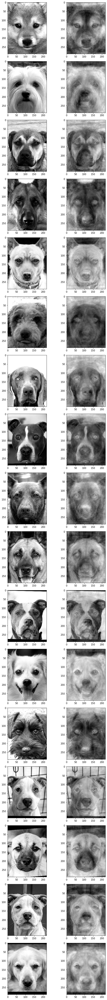

In [32]:
fig, ax = plt.subplots(nrows=17, ncols=2, figsize=(8,60)) 
for i in range(17): # imshow-al megmutaom aképeket
    ax[i, 0].imshow(imgs[i],cmap='gray')
    ax[i, 1].imshow(kutyulik[i],cmap='gray')

plt.tight_layout()
plt.show()

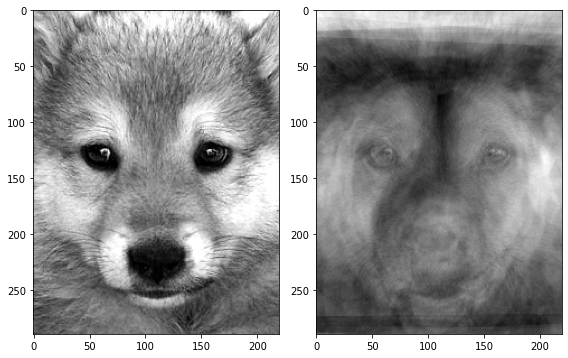

In [33]:
D=12
uj2=kutyusok[:,:,:D].reshape(63800,D)
PCK2=np.dot(Xm2,uj2) #D dimenzióra csonkolom, szerintem a 12 még felismerhető, bár olyan mint egy beszívott szellemkutya
kutyulik2=np.dot(np.array(PCK2),uj2.T).reshape(94,290,220)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,60)) 

ax[ 0].imshow(imgs[0],cmap='gray')
ax[ 1].imshow(kutyulik2[0],cmap='gray')

plt.tight_layout()
plt.show()

Rövid szöveges válasz: Szujektív, hogy mikor ismerhető még fel, valamennyire a D=1-nél is felismerhető, de nem annyira razjolódik ki, hogy hol a füle pl. 12-nél nehezen, de beazanosítom

# 4. feladatrész

A második feladatban meghatározott $N=42$ bázisvektort felhasználhatjuk olyan képek kifejtésére is, amelyek nem szerepeltek abban az adatbázisban, amely segítségével
eredetileg meghatároztuk őket. Fejtsük ki a  /v/courses/fiznum2.public/pca/101puppies/compare/ mappában levő képeket ezen a bázison, majd visszaalakítva az eredményt képpé, ellenőrizzük, hogy mennyire hasonlóak az eredetihez? 
Rövid szöveges választ is várunk.

In [34]:
kutyusok.shape

(290, 220, 94)

In [35]:
imgs2 = load_pics('/v/courses/fiznum2.public/pca/101puppies/compare/*.jpg')
imgs2.shape

(7, 290, 220)

In [36]:
kuty=imgs2-np.mean(imgs2,axis=0)
kuty2=kuty.reshape(7,63800)

In [37]:
PCK2=np.dot(kuty2,uj)
kutyulik2=np.dot(np.array(PCK2),uj.T)+np.mean(kuty2,axis=0)
kep2=kutyulik2.reshape(7,290,220)

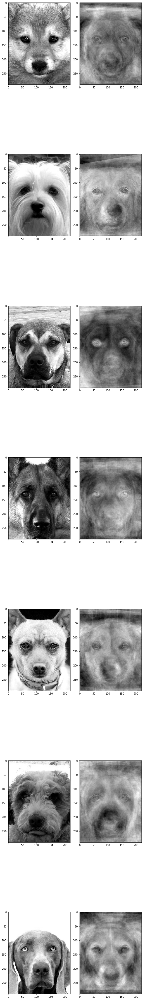

In [38]:
fig, ax = plt.subplots(nrows=7, ncols=2, figsize=(8,60)) 
for i in range(7):
    ax[i, 0].imshow(imgs[i],cmap='gray')
    ax[i, 1].imshow(kep2[i],cmap='gray')

plt.tight_layout()
plt.show()

hasonlóak, nem annyira, mint fentebb, hogyha D=40, de olyan D=15 szinten hasonlítanak

# <font color='green5'>5. Szorgalmi feladatrész</font>

A PCA egyik első felhasználása az automatikus arcfelismerés területén volt. Ebben az esetben lényegében azt a kérdést kell megválaszolni, hogy egy újonnan beérkező arckép vajon szerepel-e egy már létező adatbázisban. Ezt a következőképp lehet gyorsan eldönteni: az adatbázisban szereplő képekhez tartozó főkomponenseket együtthatókat
már eltároltuk egy-egy vektorban (praktikusan egy mátrixba összegyűjtve). 
Ezután az új fényképre is meghatározzuk a főkomponens együtthatókat és ezt is eltároljuk egy vektorban. Majd kiszámoljuk az adatbázishoz tartozó főkomponens együttható vektorok és az új kép megfelelő vektora közötti euklideszi távolságokat. Ez alatt a különbségvektor négyzetes normáját értjük.
Ha a távolságok közül valamelyik egy bizonyos határérték alatt van, akkor megállapíthatjuk, hogy az új fénykép már szerepel az adatbázisban. 

A 4-es feladatrészben használt $7$ fénykép mindegyikére végezzük el ezt a vizsgálatot! Mindegyikre írassuk ki, hogy az eredeti $94$ kutya-arc közül melyikhez van legközelebb és mennyi a távolság; valamint ábrázoljuk a beazonosítandó képet és az eredeti adatbázisban hozzá legközelebb levő képet egymás mellett! Próbáljuk eldönteni, van-e olyan távolság érték, amely alatt nyugodtan mondhatjuk, hogy a viszgált kutya-arc már szerepelt az adatbázisban.

